In this notebook we try to perform the clustering analysis with performing a stricted QC at the start of the pipeline. This is similar to how I would have performed clustering analysis in the past with the brain datasets, but here I am worried that some of the cells will go missing. In particular I think the tumor cells will be subject to filtering if we use too strict of measures at the start. After running this notebook I think it might be better to go for the less strict QC for the initial clustering, and then we can perform more filtering separately for each cell lineage. This way we won't toss out a ton of stuff. These datasets are pretty clean anyways so we still get good clusters without much QC or batch correction etc.

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
from matplotlib import pyplot as plt
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')


In [2]:
os.chdir('/home/groups/singlecell/smorabito/analysis/SERPENTINE/')
data_dir = 'data/'
fig_dir = 'figures/'


In [3]:
# load the unprocessed dataset
adata = sc.read('{}SERPENTINE_merged_unprocessed_090424.h5ad'.format(data_dir))

# save the counts layer
adata.layers['counts'] = adata.X 

In [13]:
tmp = adata.obs.Subproject_CNAG_x.unique()


# where are 
for thing in tmp:
    print(thing)

SERPENTINE_04_05
SERPENTINE_06_07
SERPENTINE_08_09
SERPENTINE_10_11
SERPENTINE_12_13
SERPENTINE_14_15
SERPENTINE_16_17
SERPENTINE_18_19
SERPENTINE_20_21
SERPENTINE_22_23
SERPENTINE_24_25
SERPENTINE_26_27
SERPENTINE_28_29
SERPENTINE_30_31
SERPENTINE_32_33
SERPENTINE_34_35
SERPENTINE_36_37
SERPENTINE_38_39
SERPENTINE_40_41
SERPENTINE_42_43


In [11]:
# remove the messed up samples with sequencing issues 
replicates_remove = adata.obs.groupby('Replicate')['total_counts'].mean() < 10
replicates_remove = replicates_remove[replicates_remove].index.to_list()
adata = adata[~adata.obs.Replicate.isin(replicates_remove)].copy()
adata.shape

/scratch_tmp/31504763/ipykernel_258991/4135604490.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  replicates_remove = adata.obs.groupby('Replicate')['total_counts'].mean() < 10


(246413, 36601)

In [12]:
replicates_remove

['SPE_1_14_C2_A_FRESH_CD45neg',
 'SPE_1_14_C2_A_FRESH_CD45pos',
 'SPE_1_15_C2_A_FRESH_CD45neg',
 'SPE_1_15_C2_A_FRESH_CD45pos']

### QC Filtering

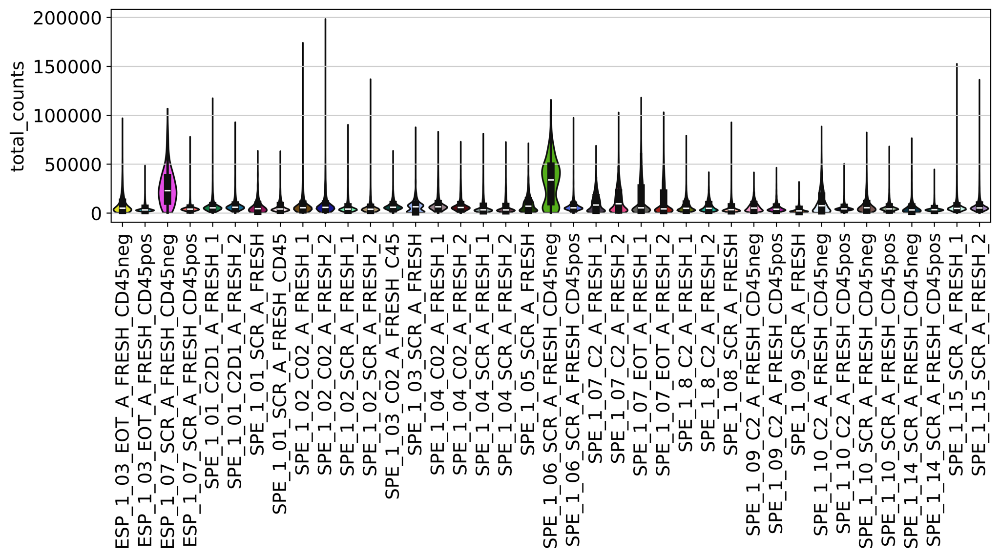

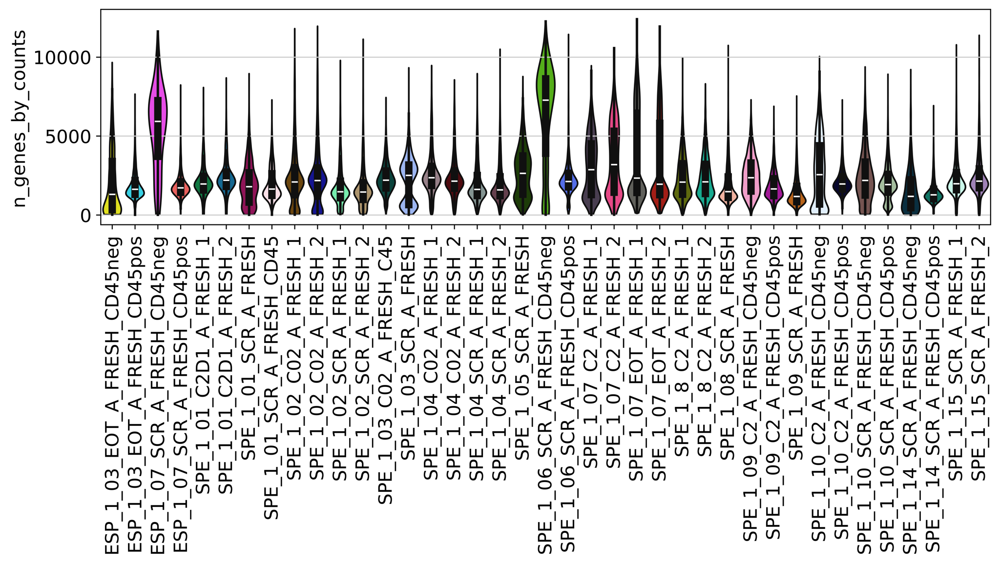

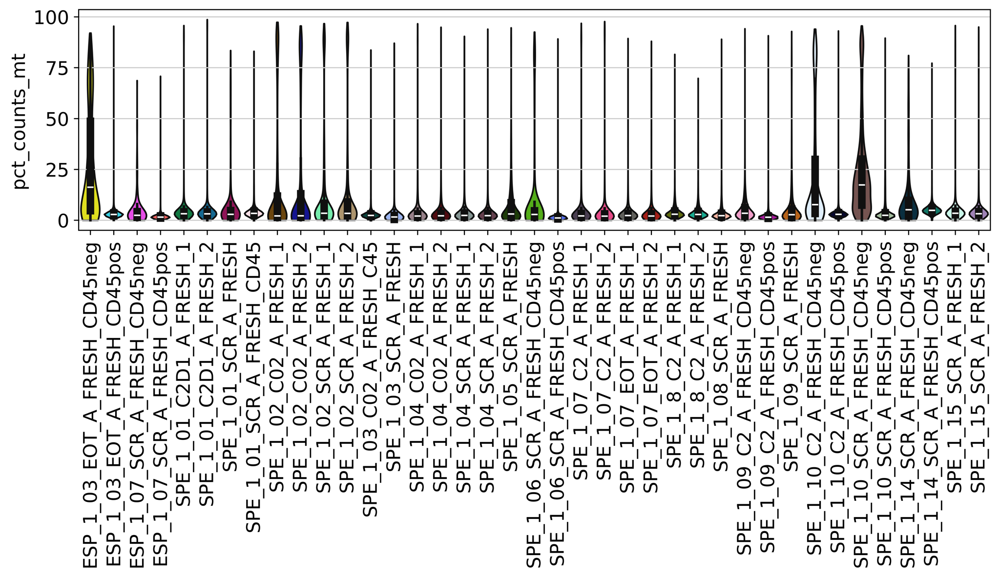

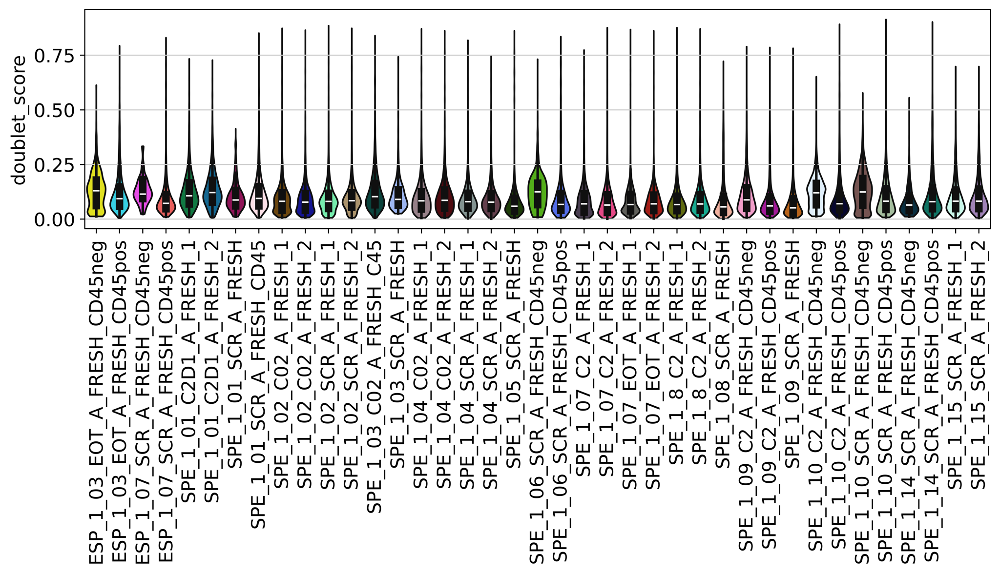

In [16]:
sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Replicate', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Replicate', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Replicate', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'doublet_score'], inner='box', size=0,  groupby='Replicate', multi_panel=False, rotation=90)

In [17]:
# just remove doublets for now 
adata = adata[adata.obs.predicted_doublet == False].copy()

In [19]:
(adata.obs.pct_counts_mt > 10).value_counts()

pct_counts_mt
False    215889
True      26596
Name: count, dtype: int64

In [20]:
adata.obs['barcode'] = adata.obs.index

In [55]:
# remove by quantiles 

mt_quantile = 0.975
umi_quantile = 0.975
doublet_quantile = 0.975

samples = adata.obs.Replicate.unique().to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Replicate == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_score.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_score < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    


/scratch_tmp/23219170/ipykernel_125238/1826754495.py:7: FutureWarning: Categorical.to_list is deprecated and will be removed in a future version. Use obj.tolist() instead
  samples = adata.obs.Replicate.unique().to_list()


SPE_1_01_SCR_A_FRESH removed  43 , kept  469
SPE_1_01_SCR_A_FRESH_CD45 removed  341 , kept  3873
SPE_1_02_SCR_A_FRESH_1 removed  460 , kept  5510
SPE_1_02_SCR_A_FRESH_2 removed  360 , kept  4435
SPE_1_01_C2D1_A_FRESH_1 removed  322 , kept  3664
SPE_1_01_C2D1_A_FRESH_2 removed  320 , kept  3289
SPE_1_02_C02_A_FRESH_1 removed  326 , kept  4214
SPE_1_03_SCR_A_FRESH removed  80 , kept  774
SPE_1_02_C02_A_FRESH_2 removed  320 , kept  3587
SPE_1_04_SCR_A_FRESH_2 removed  723 , kept  9111
SPE_1_04_SCR_A_FRESH_1 removed  764 , kept  9319
SPE_1_03_C02_A_FRESH_C45 removed  285 , kept  3185
SPE_1_04_C02_A_FRESH_1 removed  439 , kept  5084
SPE_1_04_C02_A_FRESH_2 removed  369 , kept  4282
ESP_1_03_EOT_A_FRESH_CD45neg removed  3 , kept  2
ESP_1_03_EOT_A_FRESH_CD45pos removed  584 , kept  7084
SPE_1_05_SCR_A_FRESH removed  273 , kept  3599
SPE_1_06_SCR_A_FRESH_CD45neg removed  58 , kept  728
SPE_1_06_SCR_A_FRESH_CD45pos removed  233 , kept  2856
SPE_1_08_SCR_A_FRESH removed  963 , kept  12007
SPE_1_0

In [22]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)]
adata.shape

(224146, 36601)

In [32]:
# get rid of more outliers:
adata = adata[adata.obs.total_counts >= 500]
adata = adata[adata.obs.pct_counts_mt <= 10]
adata.shape

(200737, 36601)

### Clustering

In [33]:
# normalize
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# retain the "Raw" adata object for later
adata.raw = adata

/home/groups/singlecell/smorabito/.conda/envs/serp-scanpy/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [34]:
# identify HVGs
sc.pp.highly_variable_genes(adata)

In [35]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

In [36]:
sc.external.pp.harmony_integrate(
    adata, 
    key = ['Subproject_CNAG_x']
)

2024-05-17 12:02:38,884 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-05-17 12:03:29,490 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-05-17 12:03:30,951 - harmonypy - INFO - Iteration 1 of 10
2024-05-17 12:04:42,746 - harmonypy - INFO - Iteration 2 of 10
2024-05-17 12:05:54,217 - harmonypy - INFO - Iteration 3 of 10
2024-05-17 12:07:05,419 - harmonypy - INFO - Iteration 4 of 10
2024-05-17 12:08:16,736 - harmonypy - INFO - Iteration 5 of 10
2024-05-17 12:09:26,891 - harmonypy - INFO - Iteration 6 of 10
2024-05-17 12:10:11,835 - harmonypy - INFO - Iteration 7 of 10
2024-05-17 12:10:57,796 - harmonypy - INFO - Converged after 7 iterations


In [37]:
sc.pp.neighbors(adata, use_rep = 'X_pca', n_neighbors=20, n_pcs=30, metric='cosine')


/home/groups/singlecell/smorabito/.conda/envs/serp-scanpy/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [38]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [39]:
# clustering 
for res in [0.5, 1.0, 1.5, 2.0]:
    print(res)
    x = 'leiden_' + str(res)
    sc.tl.leiden(adata, resolution=res)
    adata.obs[x] = adata.obs.leiden
    


# sc.tl.leiden(adata, resolution=1)
# adata.obs['leiden_1.0'] = adata.obs.leiden
# sc.tl.leiden(adata, resolution=2)
# adata.obs['leiden_2.0']


0.5


/scratch_tmp/23219170/ipykernel_125238/903098615.py:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=res)


1.0
1.5
2.0


In [40]:
#sc.tl.dendrogram(adata, 'leiden_2.0')

In [41]:
# save the results
adata.write('{}SERPENTINE_PCA_17-05-24.h5ad'.format(data_dir))

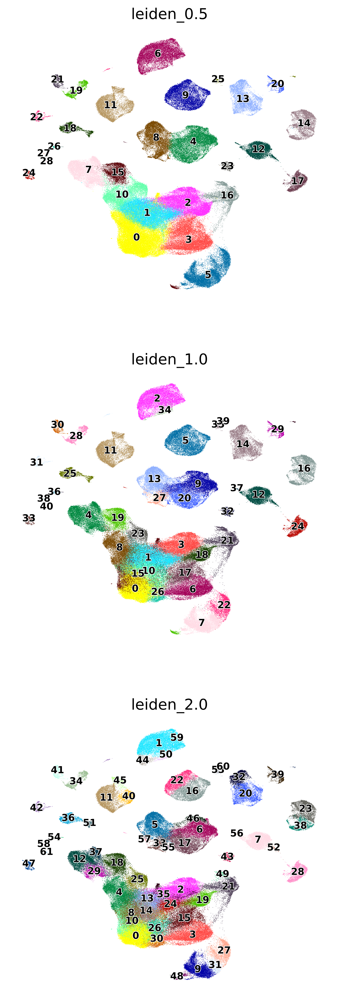

In [42]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden_0.5', 'leiden_1.0', 'leiden_2.0'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=1,
    save='_leiden_qc.pdf'
)

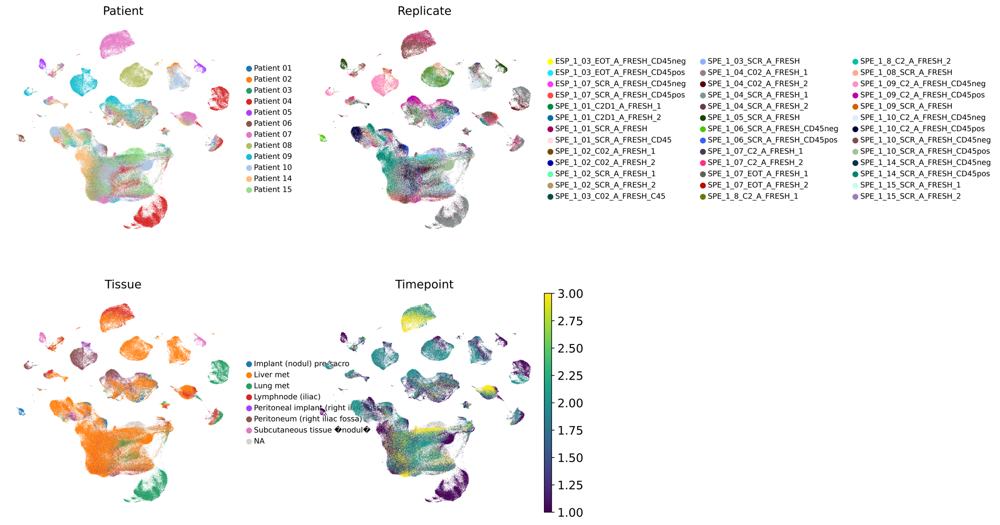

In [43]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['Patient', 'Replicate', 'Tissue', 'Timepoint'],
    frameon=False, 
    #legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=2,
    #title='',
    save='_patients.pdf'
)

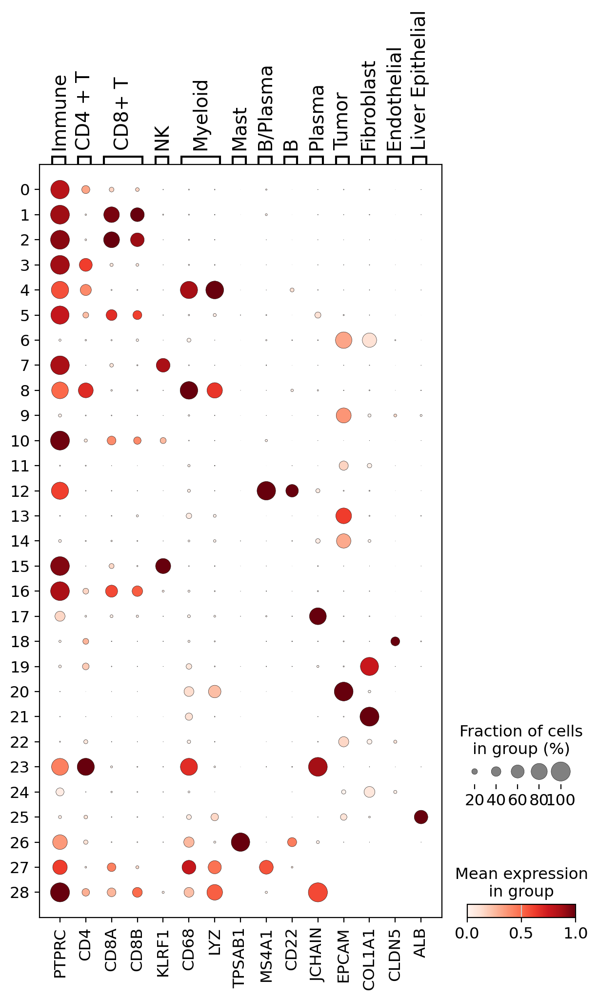

In [44]:

sc.settings.set_figure_params(dpi=100, dpi_save=300, figsize=(15,5), facecolor='white')

marker_dict = {
    'Immune': ['PTPRC'],
    'CD4 + T': ['CD4'],
    'CD8+ T': ['CD8A', 'CD8B'],
    'NK': ['KLRF1'],
    'Myeloid': ['CD68', 'LYZ'],
    'Mast': ['TPSAB1'],
    'B/Plasma': ['MS4A1'],
    'B': ['CD22'],
    'Plasma': ['JCHAIN'],
    'Tumor': ['EPCAM'],
    'Fibroblast': ['COL1A1'],
    'Endothelial': ['CLDN5'],
    'Liver Epithelial': ['ALB']
}


sc.pl.dotplot(
    adata, marker_dict, 'leiden_0.5',
    #dendrogram=True,
    standard_scale='var', swap_axes=False,
    save = '_harmony_leiden_markers_primary.pdf'
)

#sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

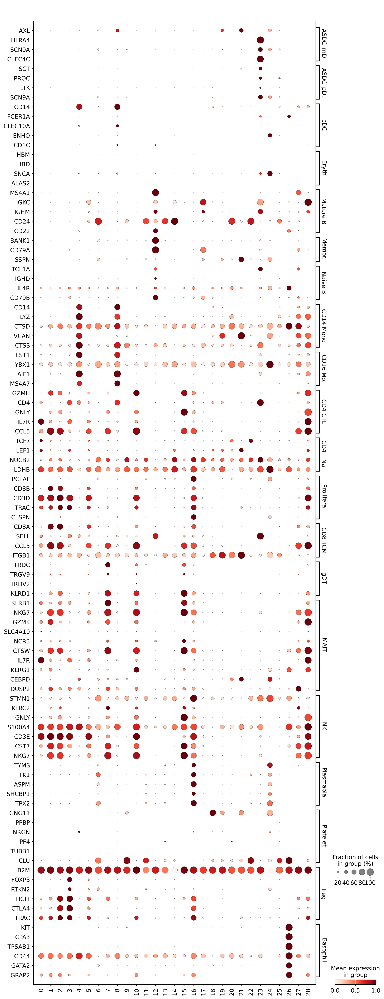

In [45]:

sc.settings.set_figure_params(dpi=300, dpi_save=300, figsize=(15,5), facecolor='white')

marker_dict = {
'ASDC_mDC': ['AXL', 'LILRA4', 'SCN9A', 'CLEC4C'],
'ASDC_pDC':['SCT', 'PROC', 'LTK', 'SCN9A'],
'cDC': ['CD14', 'FCER1A', 'CLEC10A', 'ENHO', 'CD1C'],
'Eryth': ['HBM', 'HBD', 'SNCA', 'ALAS2'],
'Mature B': ['MS4A1', 'IGKC', 'IGHM', 'CD24', 'CD22'],
'Memory B': ['BANK1', 'CD79A', 'SSPN'],
'Naive B': ['TCL1A', 'IGHD', 'IL4R', 'CD79B'],
'CD14 Mono': ['CD14', 'LYZ', 'CTSD', 'VCAN', 'CTSS'],
'CD16 Mono': ['LST1', 'YBX1', 'AIF1', 'MS4A7'],
'CD4 CTL': ['GZMH', 'CD4', 'GNLY', 'IL7R', 'CCL5'],
'CD4+ Naive T': ['TCF7', 'LEF1', 'NUCB2', 'LDHB'],
'Proliferating T': ['PCLAF', 'CD8B', 'CD3D', 'TRAC', 'CLSPN'],
'CD8 TCM': ['CD8A', 'SELL', 'CCL5', 'ITGB1'],
'gDT': ['TRDC', 'TRGV9', 'TRDV2', 'KLRD1'],
'MAIT': ['KLRB1', 'NKG7', 'GZMK', 'SLC4A10', 'NCR3', 'CTSW', 'IL7R', 'KLRG1', 'CEBPD', 'DUSP2'],
'NK': ['STMN1', 'KLRC2', 'GNLY', 'S100A4', 'CD3E', 'CST7', 'NKG7'],
'Plasmablast': ['TYMS', 'TK1', 'ASPM', 'SHCBP1', 'TPX2'],
'Platelet': ['GNG11', 'PPBP', 'NRGN', 'PF4', 'TUBB1', 'CLU'],
'Treg': ['B2M', 'FOXP3', 'RTKN2', 'TIGIT', 'CTLA4', 'TRAC'],
'Basophil': ['KIT', 'CPA3', 'TPSAB1', 'CD44', 'GATA2', 'GRAP2']
}



sc.pl.dotplot(
    adata, marker_dict, 'leiden_0.5',
    standard_scale='var', swap_axes=True,
    save = '_leiden_markers_dict.pdf'
)

#sc.pl.dotplot(adata, marker_dict, groupby='leiden', figsize=(12,6), standard_scale='var',  dendrogram=True, save='markers.pdf')

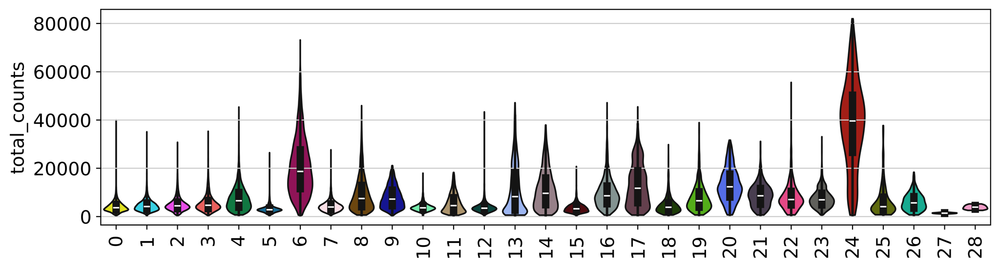

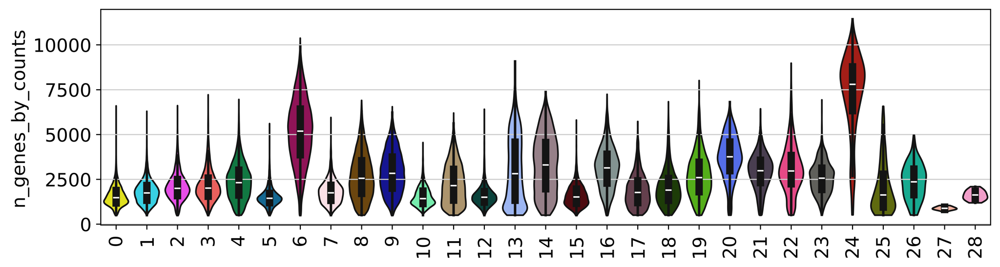

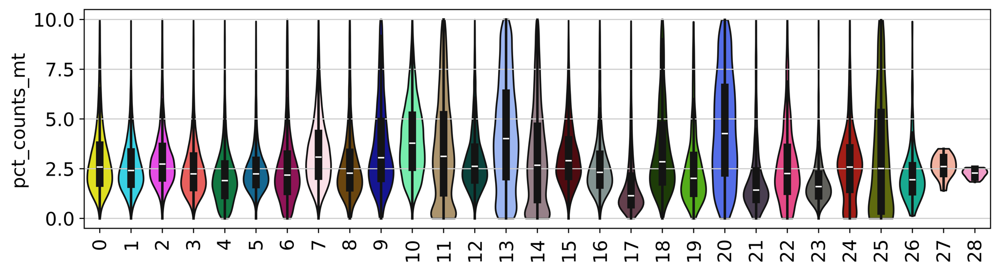

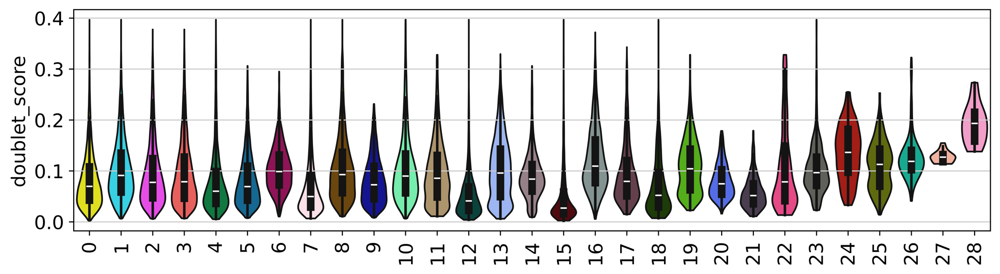

In [54]:
sc.settings.set_figure_params(dpi=400, dpi_save=400, figsize=(10,3), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden_0.5', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden_0.5', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden_0.5', multi_panel=False, rotation=90)
sc.pl.violin(adata,[ 'doublet_score'], inner='box', size=0,  groupby='leiden_0.5', multi_panel=False, rotation=90)

In [46]:
import seaborn as sns

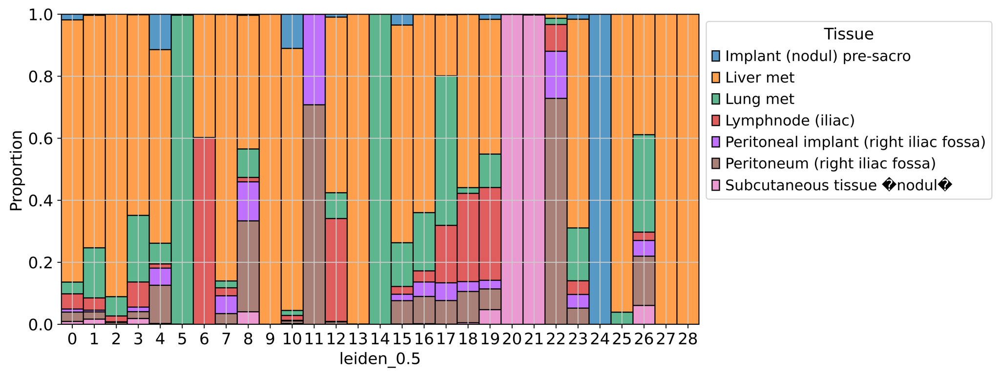

In [47]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(10,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden_0.5',
    hue = 'Tissue',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

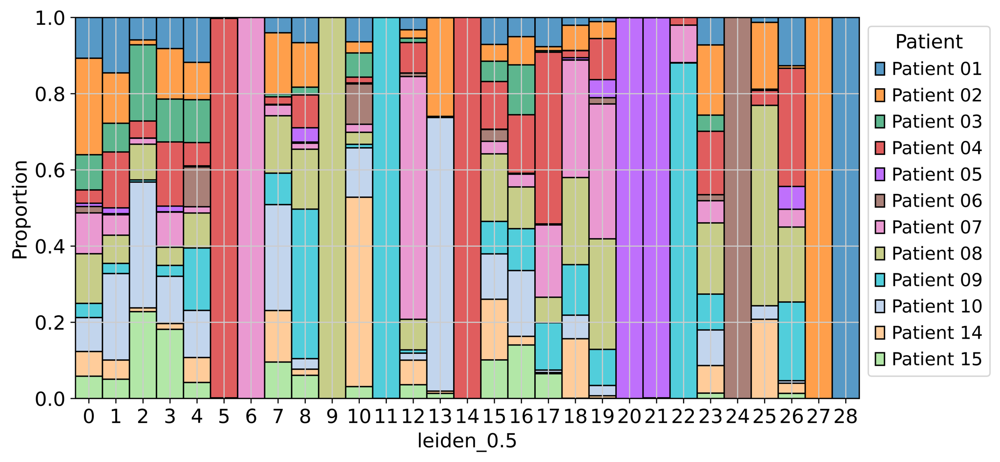

In [48]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(10,5), facecolor='white')
ax = sns.histplot(
    data = adata.obs,
    x = 'leiden_0.5',
    hue = 'Patient',
    multiple='fill', stat='proportion',
    discrete=True
)
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

## Add previous annotations from Gerard

In [49]:
anno_df = pd.read_table('{}/SP_annotations.csv'.format(data_dir), sep=',')
anno_df = anno_df.rename({'Unnamed: 0': 'barcode'}, axis=1)

anno_df['bc'] = [x.split('_')[-1] for x in anno_df.barcode.to_list()]
anno_df['bc_sample'] = anno_df['sample'].astype(str) + '-' + anno_df.bc.astype(str)

anno_df.head()

,barcode,sample,Annotation_1.0,Annotation_2.0,bc,bc_sample
0,SERPENTINE_04_05_01_CD45_AAACCTGAGCTCAACT,SPE_1_01_SCR_A_FRESH_CD45,Myeloid,cDC2,AAACCTGAGCTCAACT,SPE_1_01_SCR_A_FRESH_CD45-AAACCTGAGCTCAACT
1,SERPENTINE_04_05_01_CD45_AAACCTGAGTGGGATC,SPE_1_01_SCR_A_FRESH_CD45,Myeloid,CD14+ CD16- Mono,AAACCTGAGTGGGATC,SPE_1_01_SCR_A_FRESH_CD45-AAACCTGAGTGGGATC
2,SERPENTINE_04_05_01_CD45_AAACCTGAGTTAAGTG,SPE_1_01_SCR_A_FRESH_CD45,CD8 T,CD8+ Trm Exhausted,AAACCTGAGTTAAGTG,SPE_1_01_SCR_A_FRESH_CD45-AAACCTGAGTTAAGTG
3,SERPENTINE_04_05_01_CD45_AAACCTGTCCGCAGTG,SPE_1_01_SCR_A_FRESH_CD45,CD8 T,T Proliferative,AAACCTGTCCGCAGTG,SPE_1_01_SCR_A_FRESH_CD45-AAACCTGTCCGCAGTG
4,SERPENTINE_04_05_01_CD45_AAACGGGAGCGTTTAC,SPE_1_01_SCR_A_FRESH_CD45,CD4 T,CD4+ T Helper,AAACGGGAGCGTTTAC,SPE_1_01_SCR_A_FRESH_CD45-AAACGGGAGCGTTTAC


In [50]:
adata.obs['bc_sample'] = adata.obs.Replicate.astype(str) + '-' + adata.obs.bc.astype(str)

In [51]:

# merge with anndata obs
temp = adata.obs.merge(anno_df, how='left', on = 'bc_sample')
#temp.index = temp.barcode
#adata.obs = temp

temp.head()

adata.obs['init_annot_1'] = temp['Annotation_1.0'].to_list()
adata.obs['init_annot_2'] = temp['Annotation_2.0'].to_list()


#adata.obs['general_annot'] = temp.general_annot.to_list()
#adata.obs['lv1_annot'] = temp.lv1_annot.to_list()

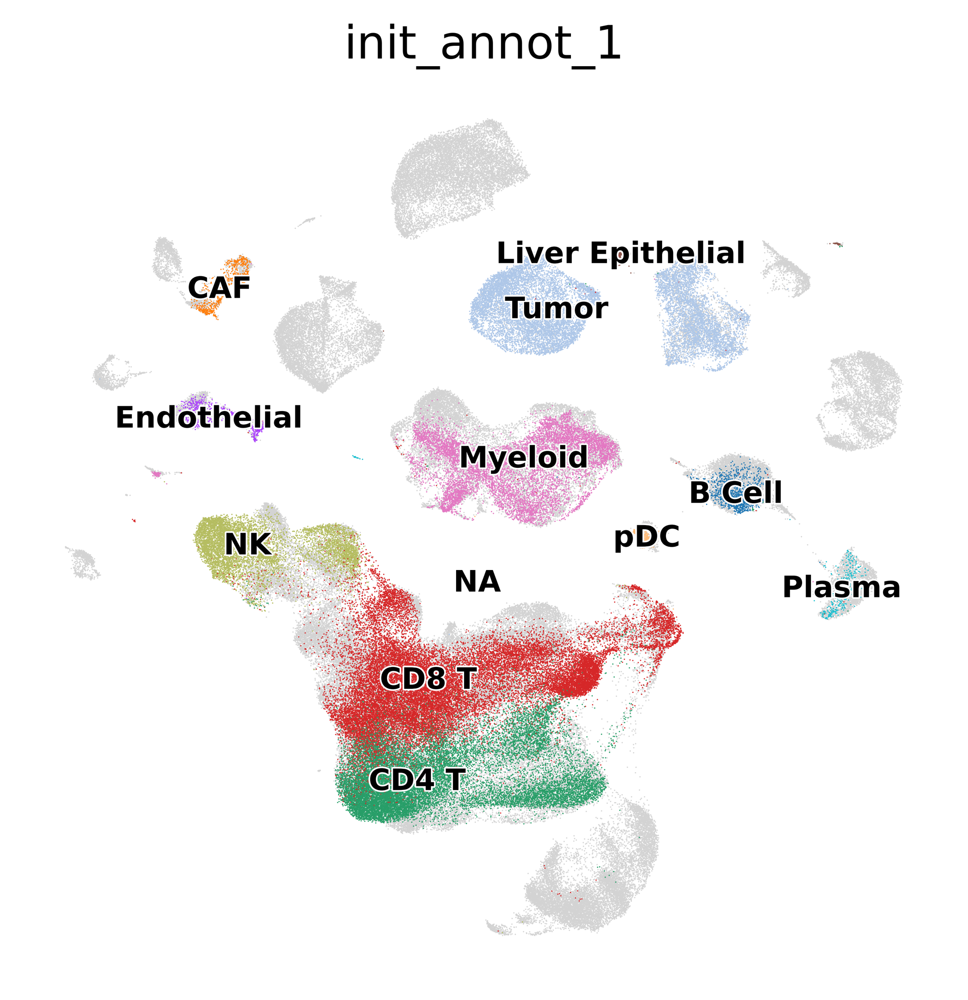

In [52]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['init_annot_1'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=1,
    save='_annot1_previous_QC.pdf'
)

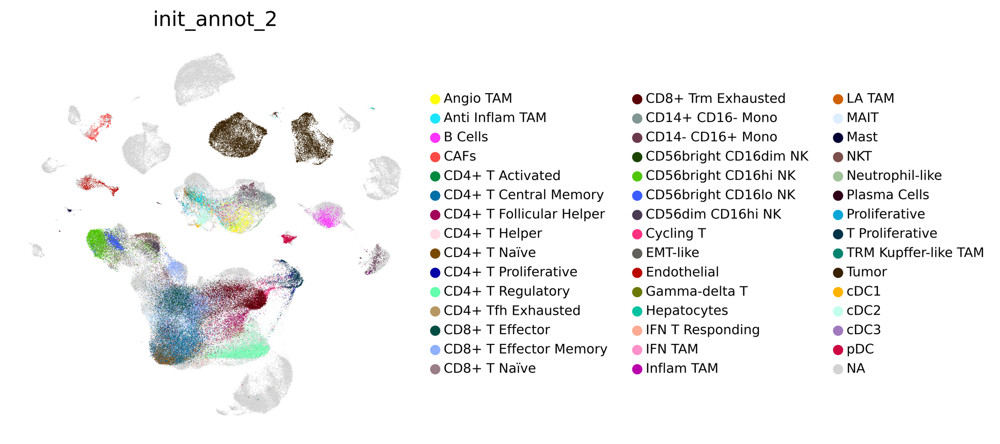

In [53]:
sc.settings.set_figure_params(dpi=400, dpi_save=500, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['init_annot_2'],
    frameon=False, 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    ncols=1,
    save='_annot2_previous_QC.pdf'
)